In [1]:
import scanpy as sc
import scvi
from utils import preprocessing
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [2]:
adata = sc.read_h5ad(
    #"/home/gdallagl/myworkdir/XDP/data/XDP/NucSec/original_data/NucSeq_all_labelled_zoned.h5ad", 
    "/home/gdallagl/myworkdir/XDP/data/XDP/artificial_bican/geneset_001/zonated_objs_combined_with_md__combined__rep_001__ventral_matrix_keep_1.0_raw.h5ad",
    #backed="r"
    )
adata

AnnData object with n_obs × n_vars = 191639 × 37905
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'donor_id', 'PREFIX', 'CELL_BARCODE', 'NUM_GENIC_READS', 'NUM_TRANSCRIPTS', 'NUM_GENES', 'num_retained_transcripts', 'pct_coding', 'pct_utr', 'pct_intergenic', 'pct_genic', 'pct_intronic', 'pct_mt', 'pct_ribosomal', 'frac_contamination', 'experiment', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Class_name', 'Class_bootstrapping_probability', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Group_name', 'Group_bootstrapping_probability', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'x', 'y', 'library', 'donor', 'x_um2', 'y_um2', 'unique_cell_ID', 'cb', 'Final_Zone_Assignments', 'Group_name.1', 'cell_type', 'Cohort', 'Biobank', 'Age.at.Death', 'Sex', 'Race', 'Ethnicity', 'Cause.of.Death', 'PMI', 'spn_type', 'case_control', 'RNA_snn_res.0.2', 'seurat_clusters', 'RNA_snn_res.0.5', 'Row.names', 'PC_1', 'PC_2', 'PC_3', 'PC_4', 'PC_5', 'P

In [3]:
adata = adata[adata.obs.spn_type == "dorsal_matrix"].copy()

# mask = (
#     (adata.obs["Group_name"].isin(["STRd D1 Matrix MSN", "STRd D1 Striosome MSN", "STRv D1 MSN", "STRd D2 Matrix MSN", "STRd D2 Striosome MSN", "STRv D2 MSN", "STRd D2 StrioMat Hybrid MSN", "STR D1D2 Hybrid MSN", "STRv D1 NUDAP MSN"])) #&
#     # (adata.obs["tissue"] == "Striatum") &
#     # (adata.obs["sex"] == "M")
# )

# adata = adata[mask].to_memory()
# adata

# Define

In [4]:
# name of Sample varibale
SAMPLE_VARIABLE = "donor_id"
# variable to test if differtially epxressed
CONTRAST_VARIABLE = "case_control"
# Level of contrat varibale to use as baseline
CONTRAST_BASELINE = "control"
# Level of contrat varibale to use as stimulated
CONTRAST_STIM = "case"
# name of cell tyoe vauble annotaton to use in this analsys
CT_FOR_DEG_VARIABLE = "spn_type" #"Group_name"
ZONE_VARIABLE="Final_Zone_Assignments"
BATCH_KEY=None#"cohort"
plot_list = [SAMPLE_VARIABLE, CONTRAST_VARIABLE, CT_FOR_DEG_VARIABLE, ZONE_VARIABLE, "Group_name"]#, "zonw", "sex", "brain_bank", "cohort", "repeat_length", "infection_related_death"]# "laiden_salient", "laiden_background"]


In [5]:
healthy_indices = np.where(adata.obs[CONTRAST_VARIABLE] == CONTRAST_BASELINE)[0]
diseased_indices = np.where(adata.obs[CONTRAST_VARIABLE] == CONTRAST_STIM)[0]

healthy_adata = adata[healthy_indices].copy()
diseased_adata = adata[diseased_indices].copy()

# Initial Umaps

In [6]:
for a in [adata, healthy_adata, diseased_adata]:
    if "counts" in a.layers:
        print("Putting raw counts in .X")
        a.X = a.layers["counts"].copy()
    else:
        print("Be sure that .X is raw counts")
    preprocessing.preprocess(a, save_raw_counts=(not("counts" in a.layers)))
    #a.obs["Final_Zone_Assignments"] = a.obs["Final_Zone_Assignments"].astype("category")

    # remoc .X useless
    import scipy.sparse as sp
    a.X = sp.csr_matrix(a.shape)

Be sure that .X is raw counts
Expect .X is raw counts!
Normalizing...
Findingn HVGs...
Scaling...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


Calculating PCA...
Calculating neighbors...
Calculating Umap...
Clutering...
Preprocessing done.
Be sure that .X is raw counts
Expect .X is raw counts!
Normalizing...
Findingn HVGs...
Scaling...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


Calculating PCA...
Calculating neighbors...
Calculating Umap...
Clutering...
Preprocessing done.
Be sure that .X is raw counts
Expect .X is raw counts!
Normalizing...
Findingn HVGs...
Scaling...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


Calculating PCA...
Calculating neighbors...
Calculating Umap...
Clutering...
Preprocessing done.


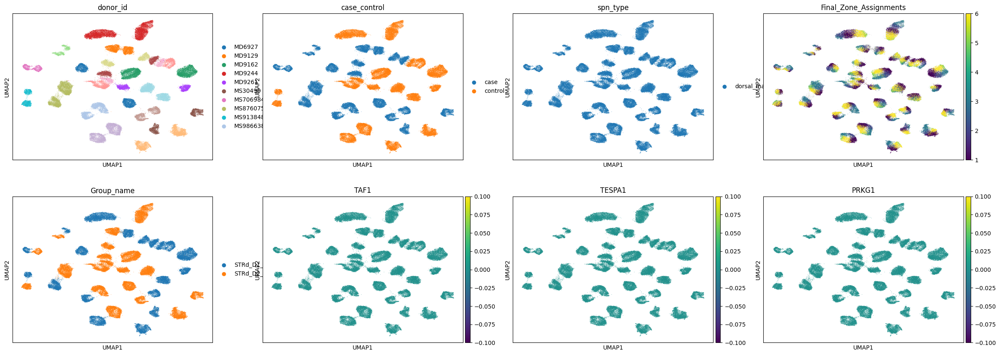

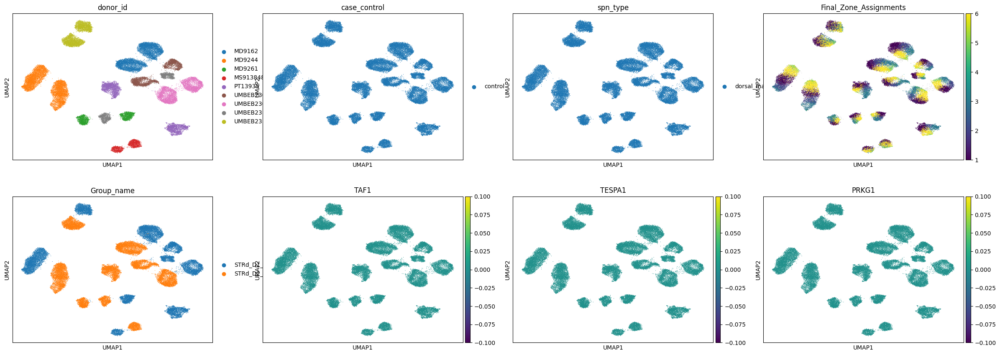

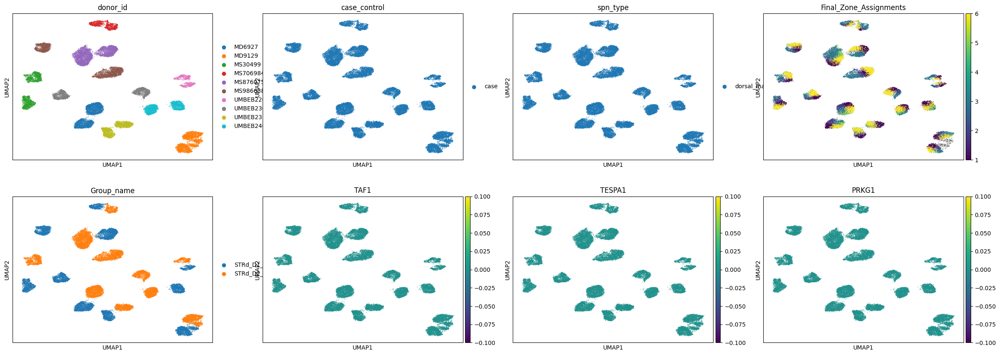

In [7]:
for a in [adata, healthy_adata, diseased_adata]:
    sc.pl.umap(a, color=[*plot_list, "TAF1", "TESPA1", "PRKG1"])

# Run VI

In [8]:
# Make adata with HVG only
adata = adata[:, adata.var.highly_variable].copy()
hvg_genes = adata.var_names[adata.var["highly_variable"]]
healthy_adata = healthy_adata[:, healthy_adata.var_names.isin(hvg_genes)].copy()
diseased_adata = diseased_adata[:, diseased_adata.var_names.isin(hvg_genes)].copy()

In [9]:
scvi.external.ContrastiveVI.setup_anndata(
    adata, 
    layer="counts",
    batch_key=BATCH_KEY, #"donor_id"
    labels_key=CT_FOR_DEG_VARIABLE,
    # categorical_covariate_keys=None,  # Additional covariates
    # continuous_covariate_keys=None    # Continuous covariates
    )

contrastive_vi_model = scvi.external.ContrastiveVI(
    adata, 
    n_salient_latent=20, 
    n_background_latent=20, 
    use_observed_lib_size=True
)


In [10]:
contrastive_vi_model.train(
    background_indices=healthy_indices,
    target_indices=diseased_indices,
    batch_size=256,
    early_stopping=True,
    max_epochs=100,
    #num_workers=8
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Training:   0%|          | 0/100 [00:00<?, ?it/s]

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/lightning/pytorch/utilities/data.py:79: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 128. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/lightning/pytorch/utilities/data.py:79: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 42. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
`Trainer.fit` stopped: `max_epochs=100` reached.


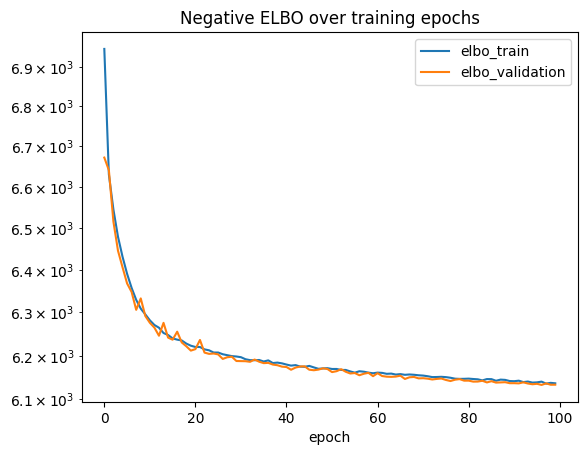

In [11]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1)
contrastive_vi_model.history["elbo_train"].plot(ax=ax, label="train")
contrastive_vi_model.history["elbo_validation"].plot(ax=ax, label="validation")
ax.set(title="Negative ELBO over training epochs")
ax.set_yscale("log")
ax.legend()

/tmp/ipykernel_1442654/3193971205.py:10: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(a, resolution=0.01, key_added="leiden_salient", neighbors_key="salient_neighbors")


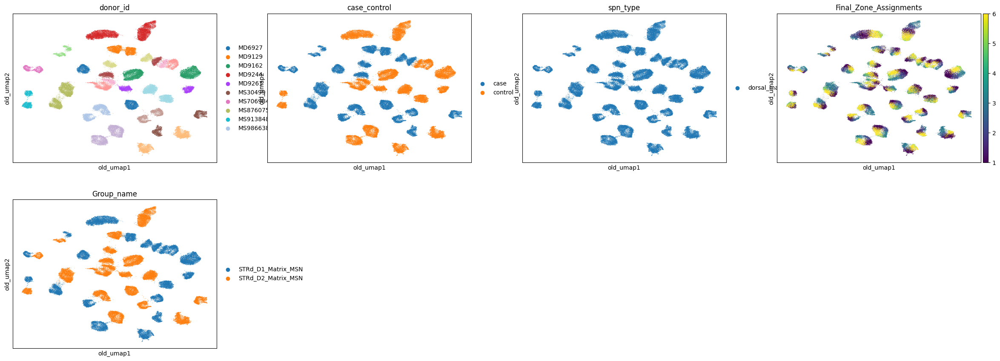

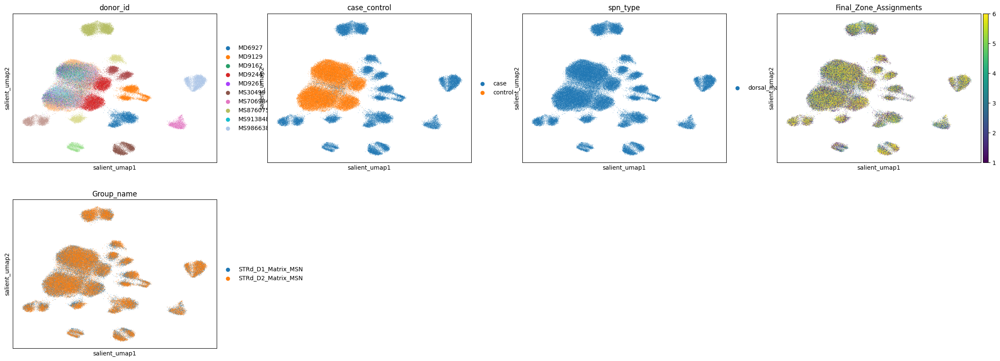

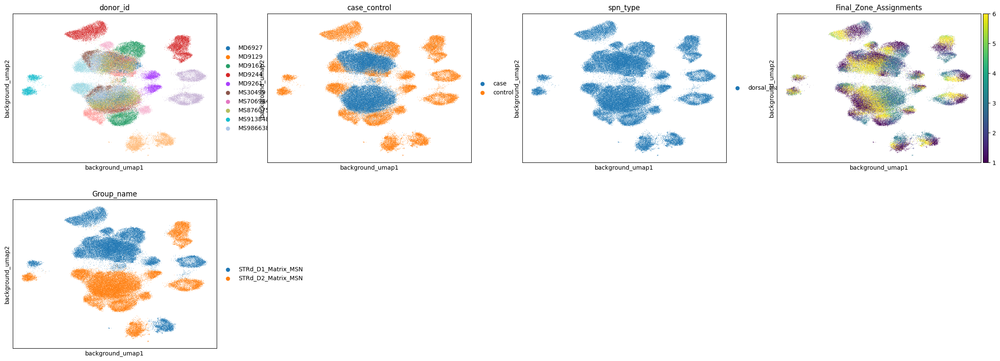

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


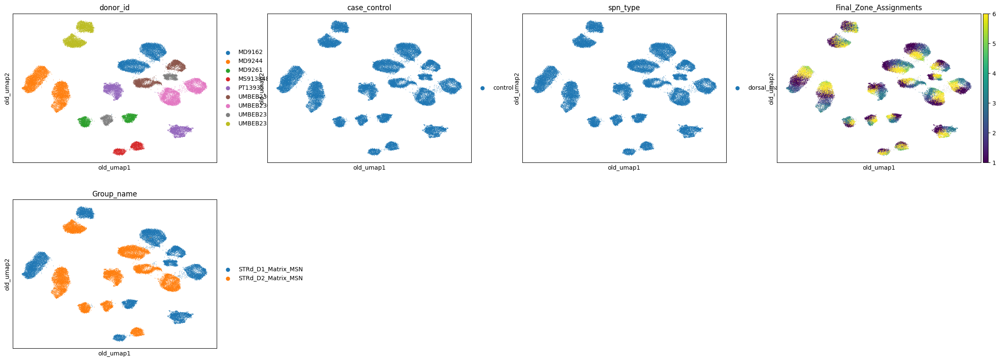

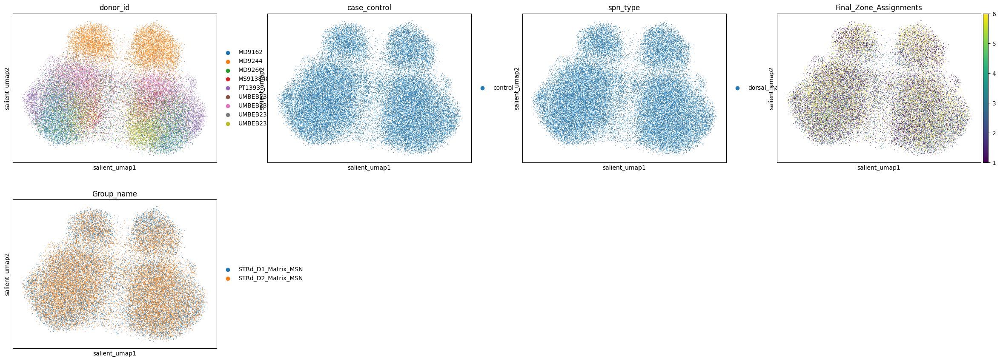

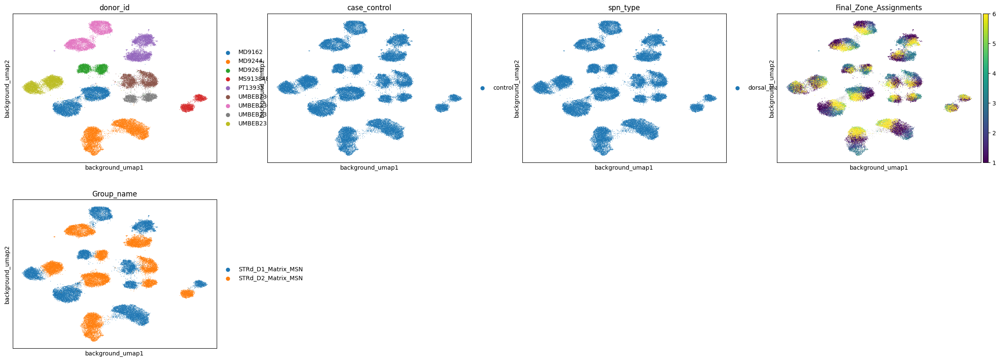

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


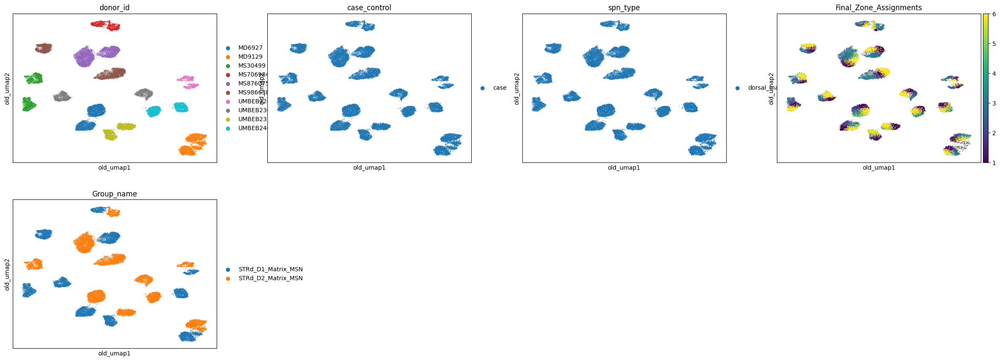

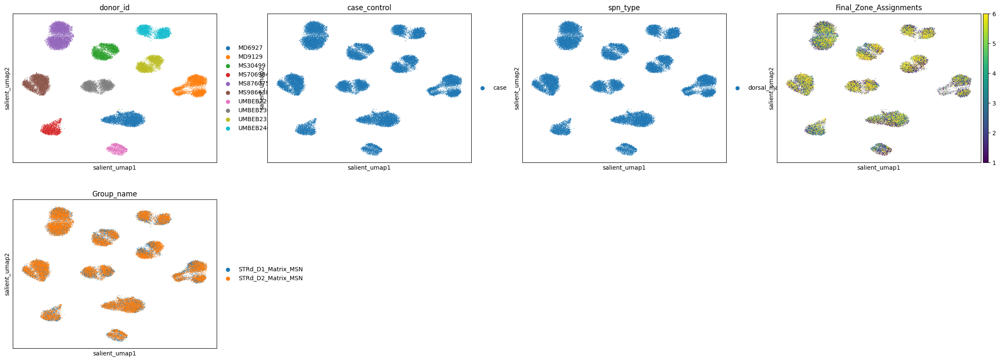

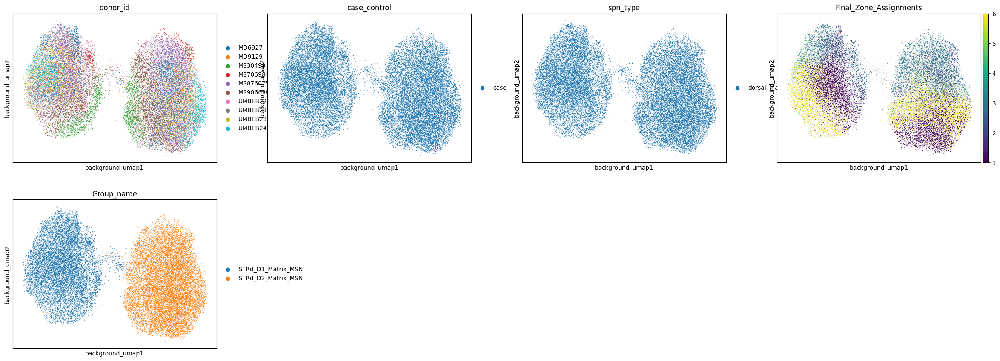

In [12]:
for a in [adata, healthy_adata, diseased_adata]:

    a.obsm["salient_rep"] = contrastive_vi_model.get_latent_representation(a, representation_kind="salient")
    a.obsm['background_rep'] = contrastive_vi_model.get_latent_representation(a, representation_kind='background')

    a.obsm["old_umap"] = a.obsm["X_umap"].copy()

    sc.pp.neighbors(a, use_rep="salient_rep", key_added="salient_neighbors")
    sc.tl.umap(a, neighbors_key="salient_neighbors")
    sc.tl.leiden(a, resolution=0.01, key_added="leiden_salient", neighbors_key="salient_neighbors")
    a.obsm["salient_umap"] = a.obsm["X_umap"].copy()

    sc.pp.neighbors(a, use_rep="background_rep", key_added="background_neighbors")
    sc.tl.umap(a, neighbors_key="background_neighbors")
    sc.tl.leiden(a, resolution=0.01, key_added="leiden_background", neighbors_key="background_neighbors")
    a.obsm["background_umap"] = a.obsm["X_umap"].copy()

    sc.pl.embedding(a, basis="old_umap", color=plot_list)
    sc.pl.embedding(a, basis="salient_umap", color=plot_list)
    sc.pl.embedding(a, basis="background_umap", color=plot_list)


# DEG

In [13]:
# Read aritificla perturbed gene
    # checj min lofc
import pandas as pd
pert_de_results = pd.read_csv(f"/home/gdallagl/myworkdir/XDP/data/XDP/artificial_bican/geneset_001/genes.csv")
display(pert_de_results.head(3))

,gene_id,log2fc,frac_applied,n_subjects_applied,subjects_applied
0,ENSG00000237280,0.522222,0.3,3,"MD9129,MS986638,UMBEB23076"
1,ENSG00000250027,0.733333,0.7,7,"MD9129,MS30499,MS706984,MS876075,MS986638,UMBE..."
2,ENSG00000289321,-0.733333,0.4,4,"MD6927,MS30499,MS876075,MS986638"


STRd_D1_Matrix_MSN
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        


DE...:   0%|          | 0/1 [00:00<?, ?it/s]


Total genes analyzed: 3000

Top 20 genes by probability of DE:
                 proba_de  proba_not_de  bayes_factor        scale1  \
ENSG00000286218    0.7784        0.2216      1.256367  9.465175e-06   
LINC03033          0.7668        0.2332      1.190330  2.041463e-05   
ENSG00000274652    0.7482        0.2518      1.089035  2.700723e-07   
ATP6V1G3           0.7248        0.2752      0.968398  4.916604e-07   
LINC01170          0.7184        0.2816      0.936539  5.196014e-05   
GRPR               0.7152        0.2848      0.920775  2.985106e-06   
LINC02612          0.7062        0.2938      0.876999  1.638975e-06   
ENSG00000228627    0.6942        0.3058      0.819829  1.410723e-06   
ENSG00000290529    0.6842        0.3158      0.773141  1.531438e-05   
NDN                0.6810        0.3190      0.758371  1.814706e-04   
ENSG00000236837    0.6808        0.3192      0.757451  3.715286e-07   
ENSG00000287427    0.6758        0.3242      0.734537  5.279421e-07   
LINC01822    

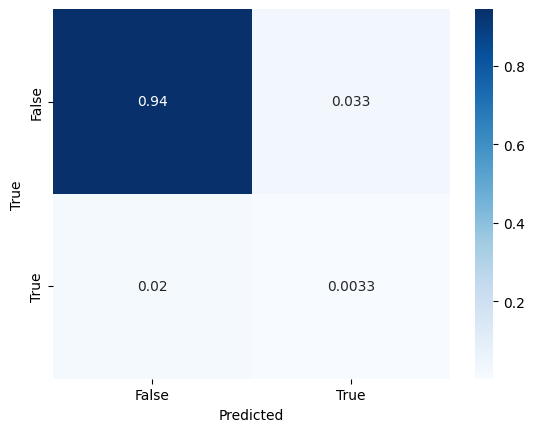


Precision: 0.093
Recall:    0.143
F1 Score:  0.112
Accuracy:  0.947
STRd_D2_Matrix_MSN
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        


DE...:   0%|          | 0/1 [00:00<?, ?it/s]


Total genes analyzed: 3000

Top 20 genes by probability of DE:
                 proba_de  proba_not_de  bayes_factor        scale1  \
ENSG00000286218    0.8190        0.1810      1.509587  5.854569e-06   
ZNF676             0.7530        0.2470      1.114677  5.341244e-05   
LINC01170          0.7460        0.2540      1.077391  5.501042e-05   
LINC03033          0.7392        0.2608      1.041815  2.279716e-05   
ATP6V1G3           0.7344        0.2656      1.017062  5.848439e-07   
MCTP2              0.7280        0.2720      0.984499  1.906068e-03   
ENSG00000236837    0.7186        0.2814      0.937528  2.778425e-07   
NDN                0.7180        0.2820      0.934562  2.096152e-04   
GRPR               0.7170        0.2830      0.929629  4.528407e-06   
ENSG00000274652    0.7168        0.2832      0.928643  8.795175e-08   
LINC02612          0.7068        0.2932      0.879893  1.262024e-06   
LINC02376          0.7060        0.2940      0.876035  2.486233e-07   
LINC01435    

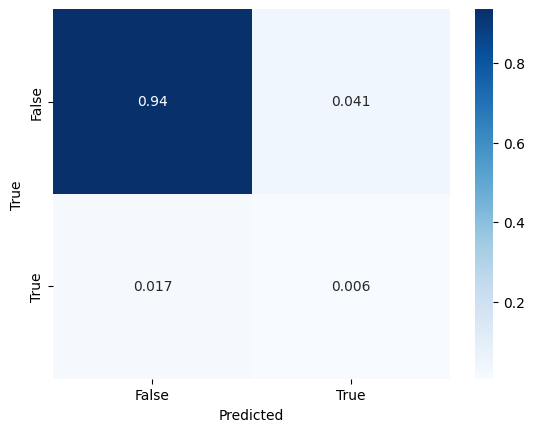


Precision: 0.128
Recall:    0.257
F1 Score:  0.171
Accuracy:  0.942


In [21]:
# Perform differential expression between case and control
# This uses the full dataset (all cells) or you can use diseased_adata if you only want to compare within disease context

CT_FOR_DEG_VARIABLE = "Group_name"
import seaborn as sns

for cell_type in adata.obs[CT_FOR_DEG_VARIABLE].unique():

    print(cell_type)

    adata_tmp = adata[adata.obs[CT_FOR_DEG_VARIABLE] == cell_type].copy()

    de_results = contrastive_vi_model.differential_expression(
        adata=adata_tmp,  # Use your full dataset
        groupby=CONTRAST_VARIABLE,  # The column containing case/control labels
        group1=CONTRAST_STIM,  # Your CONTRAST_STIM value
        group2=CONTRAST_BASELINE,  # Your CONTRAST_BASELINE value
        mode="change",  # This mode accounts for continuous variation
        batch_size=128,
        all_stats=True,  # Get all statistics
        batch_correction=False,  # We're not correcting for batches
        fdr_target=0.05,  # False discovery rate threshold
        silent=False,
    )

    # View the results
    print(f"\nTotal genes analyzed: {len(de_results)}")
    print("\nTop 20 genes by probability of DE:")
    print(de_results.sort_values('proba_de', ascending=False).head(20))

    de_results["is_significant"] = de_results["proba_de"] > 0.6
    de_results["is_true_DEG"] = de_results.index.isin(pert_de_results.gene_id.tolist())


    # Confussion matrix
    cm_df = pd.crosstab(de_results["is_true_DEG"], de_results["is_significant"], normalize="all")
    sns.heatmap(cm_df, annot=True, cmap="Blues")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

    # Calculate performance metrics
    de_results["TP"] = (de_results["is_true_DEG"] == True)  & (de_results["is_significant"] == True)
    de_results["TN"] = (de_results["is_true_DEG"] == False) & (de_results["is_significant"] == False)
    de_results["FP"] = (de_results["is_true_DEG"] == False) & (de_results["is_significant"] == True)
    de_results["FN"] = (de_results["is_true_DEG"] == True)  & (de_results["is_significant"] == False)
    tp = de_results['TP'].sum()
    tn = de_results['TN'].sum()
    fp = de_results['FP'].sum()
    fn = de_results['FN'].sum()

    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    accuracy = (tp + tn) / (tp + tn + fp + fn)

    print(f"\nPrecision: {precision:.3f}")
    print(f"Recall:    {recall:.3f}")
    print(f"F1 Score:  {f1:.3f}")
    print(f"Accuracy:  {accuracy:.3f}")




In [23]:
de_results["is_significant"].sum()

np.int64(141)

---
---
---